This notebook reads MCD files in then export the individual TIFF from MCD

In [2]:
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import pickle as pkl
import skimage
import yaml
from typing import Union, Optional, Type, Tuple, List, Dict
import sys
from readimc import MCDFile
import re
import tifffile

#TODO: change to path of the local repository
ROOT_DIR = '/project/Xie_Lab/zgu/xiao_multiplex/multiTAP'
sys.path.append(ROOT_DIR)
sys.path.append(os.path.join(ROOT_DIR, 'image_cytof'))

from cytof.hyperion_preprocess import cytof_read_data_roi
# from cytof.hyperion_analysis import 
from cytof import utils 
from utils import process_mcd, save_multi_channel_img, check_feature_distribution, show_color_table

from cytof import classes 
from classes import CytofImage, CytofCohort, CytofImageTiff

/project/Xie_Lab/zgu/conda_stuff/envs/cytof-shared/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
search_folder = '/project/Xie_Lab/zgu/xiao_multiplex/data/zenodo_7961844'
pattern = re.compile(r'.*20201228_LC_NSCLC_TMA_175.*')
matched_folders = [name for name in os.listdir(search_folder) if pattern.match(name)]
print(matched_folders)

matched_folder = matched_folders[0] # test case

['20201228_LC_NSCLC_TMA_175']


In [73]:
output_dir = '/project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data2'
for mcd_paths in os.listdir(os.path.join(search_folder, matched_folder)):
    group = mcd_paths.split('.')[0]

    accession_find = re.search(r'_([0-9]+_[A-Z])\.mcd$', mcd_paths) # find by digits then a capital letter then .mcd
    if accession_find:
        accession = accession_find.group(1)
    print(group)
    break

2020115_LC_NSCLC_TMA_86_A


In [72]:
output_dir = '/project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data2'
for mcd_paths in os.listdir(os.path.join(search_folder, matched_folder)):
    group = mcd_paths.split('.')[0]

    accession_find = re.search(r'_([0-9]+_[A-Z])\.mcd$', mcd_paths) # find by digits then a capital letter then .mcd
    if accession_find:
        accession = accession_find.group(1)

    mcd_file = os.path.join(search_folder, matched_folder, mcd_paths)
    with MCDFile(mcd_file) as f:
        for slide in f.slides: # len(f.slides)=1

            # loop through individual ROIs
            for roi in slide.acquisitions:
                roi_id = roi.description
                roi_id = roi_id.replace(',', '_')
                print(f'processing {roi_id}:')

                try:
                    ind_roi = f.read_acquisition(roi)
                    save_path = os.path.join(output_dir, f'{group}_{roi_id}.tiff')
                    tifffile.imwrite(save_path, ind_roi, metadata=roi.metadata)
                    print('TIFF saved to', save_path)
                except OSError as e:
                    print(f'OSError for {group}_{roi_id}', e)
    break

processing A1_1:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_1.tiff
processing A1_2:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_2.tiff
processing A1_5:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_5.tiff
processing A1_6:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_6.tiff
processing A1_7:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_7.tiff
processing A1_8:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_8.tiff
processing A1_9:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_9.tiff
processing A1_10:
TIFF saved to /project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020115_LC_NSCLC_TMA_86_A_A1_10.tiff
processing A1_11:
TIFF saved to /project/Xie_L

In [ ]:
output_dir = '/project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data'

group = '2020117_LC_NSCLC_TMA_86_B'
filename = f"/project/Xie_Lab/zgu/xiao_multiplex/data/{group}.mcd"
match = re.search(r'_([0-9]+_[A-Z])\.mcd$', filename) # find by digits then a capital letter then .mcd
if match:
    accession = match.group(1)
    print(accession)


86_B


In [43]:
counter = 0
threshold = 3
with MCDFile(filename) as f:
    for slide in f.slides: # len(f.slides)=1

        # loop through individual ROIs
        for roi in slide.acquisitions:
            if counter > threshold: break
            roi_id = roi.description
            roi_id = roi_id.replace(',', '_')
            print(f'processing {roi_id}:')

            # print(roi.metadata)

            try:
                ind_roi = f.read_acquisition(roi)
                roi_transposed= ind_roi.copy()
                # roi_transposed = np.transpose(ind_roi, (1,2,0))

                save_path = os.path.join(output_dir, f'{group}_{roi_id}.tiff')
                tifffile.imwrite(save_path, roi_transposed, metadata=roi.metadata)

            except OSError as e:
                print(f'OSError for {roi_id}', e)

            counter +=1

processing B1_1:
OSError for B1_1 MCD file '2020117_LC_NSCLC_TMA_86_B.mcd' corrupted: inconsistent acquisition image data size
processing B1_2:
processing B1_3:
processing B1_4:


In [44]:
im = tifffile.imread('/project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020117_LC_NSCLC_TMA_86_B_B1_2.tiff')
im.shape

(134, 556, 531)

In [46]:
with tifffile.TiffFile("/project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020117_LC_NSCLC_TMA_86_B_B1_2.tiff") as tif:
    # Access basic metadata
    print(f"Image shape: {tif.pages[0].shape}")
    print(f"Image dtype: {tif.pages[0].dtype}")

    # print(tif.shape)
    
    # Access all tags
    for tag in tif.pages[0].tags:
        print(f"{tag.name}: {tag.value}")

Image shape: (556, 531)
Image dtype: float32
ImageWidth: 531
ImageLength: 556
BitsPerSample: 32
Compression: 1
PhotometricInterpretation: 1
ImageDescription: {"ID": "2", "Description": "B1,2", "AblationPower": "6", "AblationDistanceBetweenShotsX": "1", "AblationDistanceBetweenShotsY": "1", "AblationFrequency": "400", "AcquisitionROIID": "2", "OrderNumber": "0", "SignalType": "Dual", "DualCountStart": "1", "DataStartOffset": "173709373", "DataEndOffset": "335498701", "StartTimeStamp": "2021-01-18T10:55:29.2386887+01:00", "EndTimeStamp": "2021-01-18T11:13:23.2776877+01:00", "AfterAblationImageEndOffset": "0", "AfterAblationImageStartOffset": "0", "BeforeAblationImageEndOffset": "0", "BeforeAblationImageStartOffset": "0", "ROIStartXPosUm": "31382846", "ROIStartYPosUm": "7401512", "ROIEndXPosUm": "31915.842", "ROIEndYPosUm": "6847.829", "MovementType": "XRaster", "SegmentDataFormat": "Float", "ValueBytes": "4", "MaxY": "556", "MaxX": "531", "PlumeStart": "1826", "PlumeEnd": "2018", "Templa

In [51]:
class SetParameters():
    def __init__(self, 
                 filename: str, 
                 outdir: str, 
                 label_marker_file: str, 
                 slide: Optional[str] = 'slide1', 
                 roi: Optional[str] = 'roi1', 
                 quality_control_thres: Optional[int] = 50,
                 channels_remove: Optional[List] = None, 
                 channels_dict: Optional[Dict] = None,
                 use_membrane: Optional[bool] = True,
                 cell_radius: Optional[int] = 5, 
                 normalize_qs: Optional[List[int]] = [75, 99]):
        
        self.filename = filename
        self.outdir   = outdir
        self.slide    = slide
        self.roi      = roi
        self.quality_control_thres = quality_control_thres
        self.label_marker_file     = label_marker_file
        self.channels_remove = channels_remove if channels_remove is not None else []
        self.channels_dict   = channels_dict if channels_dict is not None else {}
        self.use_membrane    = use_membrane
        self.cell_radius     = cell_radius
        self.normalize_qs    = normalize_qs

params = SetParameters(

    # TODO: change filename and other options here
    filename='/project/Xie_Lab/zgu/xiao_multiplex/nsclc_tiff_data/2020117_LC_NSCLC_TMA_86_B_B1_2.tiff',
    # filename='/project/DPDS/Xiao_lab/shared/deep_learning_SW_RR/cytof/additional_opal_data/TP00899-T0-S1-1_Scan1_reg_5000_8000.tiff',
    outdir="../", 
    slide="hello",
    roi="b1_2",
    # label_marker_file = "/project/DPDS/Xiao_lab/shared/lcai/Ling-Ivan/component_tiff/markers_labels_phenochart.txt",
    label_marker_file = "/project/Xie_Lab/zgu/xiao_multiplex/breast_cancer_multiTAP_work/marker_labels.txt",
)

In [52]:
cytof_img, _ = cytof_read_data_roi(params.filename, slide=params.slide, roi=params.roi)

In [53]:
channels = [f"{mk}({cn})" for (mk, cn) in zip(roi.channel_labels, roi.channel_names)]
cytof_img.set_markers(markers=roi.channel_labels, labels=roi.channel_names, channels=channels) # targets, metals
channels

['75As(As75)',
 '76Se(Se76)',
 '77Se(Se77)',
 '78Se(Se78)',
 '80ArAr(ArAr80)',
 '81Br(Br81)',
 '82Kr(Kr82)',
 '83Kr(Kr83)',
 '84Sr(Sr84)',
 '85Rb(Rb85)',
 '86Sr(Sr86)',
 '87Sr(Sr87)',
 '88Sr(Sr88)',
 'Myelope_276((2996))Y89(Y89)',
 '90Zr(Zr90)',
 '91Zr(Zr91)',
 '92Zr(Zr92)',
 '93Nb(Nb93)',
 '94Mo(Mo94)',
 '95Mo(Mo95)',
 '96Mo(Mo96)',
 '97Mo(Mo97)',
 '98Mo(Mo98)',
 '99Ru(Ru99)',
 '100Ru(Ru100)',
 '101Ru(Ru101)',
 '102Ru(Ru102)',
 '103Rh(Rh103)',
 '104Pd(Pd104)',
 '105Pd(Pd105)',
 '106Pd(Pd106)',
 '107Ag(Ag107)',
 '108Cd(Cd108)',
 '109Ag(Ag109)',
 '110Cd(Cd110)',
 '111Cd(Cd111)',
 '112Cd(Cd112)',
 'FSP1 S1_2263((3411))In113(In113)',
 '114Cd(Cd114)',
 'SMA_174((3277))In115(In115)',
 '116Sn(Sn116)',
 '117Sn(Sn117)',
 '118Sn(Sn118)',
 '119Sn(Sn119)',
 '120Sn(Sn120)',
 '121Sb(Sb121)',
 '122Te(Te122)',
 '123Te(Te123)',
 '124Te(Te124)',
 '125Te(Te125)',
 '126Te(Te126)',
 '127I(I127)',
 '128Xe(Xe128)',
 '129Xe(Xe129)',
 '130Xe(Xe130)',
 '131Xe(Xe131)',
 '132Xe(Xe132)',
 '133Cs(Cs133)',
 '134Ba(

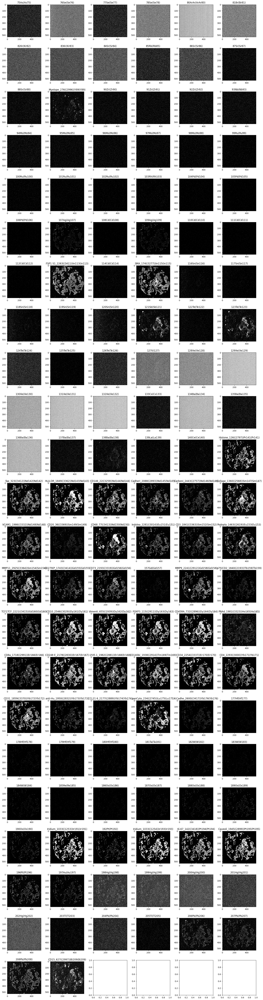

In [54]:
%matplotlib inline
cytof_img.check_channels(channels=None, xlim=[0,600], ylim=[0,600], ncols=6, vis_q=0.9, colorbar=False)



In [ ]:
cytof_img = CytofImageTiff(slide='hello', roi = 'test', image=img_roi_tp, filename=f"names")
channels = [f"{mk}({cn})" for (mk, cn) in zip(roi.channel_labels, roi.channel_names)]
cytof_img.set_markers(markers=roi.channel_labels, labels=roi.channel_names, channels=channels) # targets, metals
print(len(channels))       